In [1]:
# load libraries and data
from pathml.core.slide_data import VectraSlide
from pathml.preprocessing.pipeline import Pipeline
from pathml.preprocessing.transforms import SegmentMIF, QuantifyMIF, CollapseRunsCODEX

import numpy as np
import matplotlib.pyplot as plt
from dask.distributed import Client
from deepcell.utils.plot_utils import make_outline_overlay
from deepcell.utils.plot_utils import create_rgb_image

import scanpy as sc
import squidpy as sq
sc.set_figure_params(dpi=300, frameon=True, figsize=(8,8), format='png')

%matplotlib inline
%load_ext autoreload
%autoreload 2

slidedata = VectraSlide('/home/ryc4001/Documents/pathmlproj/nolan_codex/reg031_X01_Y01.tif')

ModuleNotFoundError: No module named 'pathml'

Here we analyze a TMA from Schurch and Nolan

https://pubmed.ncbi.nlm.nih.gov/32763154/

Coordinated Cellular Neighborhoods Orchestrate Antitumoral Immunity at the Colorectal Cancer Invasive Front

HOECHST1
blank
blank
blank

HOECHST2
CD44 - stroma
FOXP3 - regulatory T cells
CDX2 - intestinal epithelia

HOECHST3
CD8 - cytotoxic T cells
p53 - tumor suppressor
GATA3 - Th2 helper T cells

HOECHST4
CD45 - hematopoietic cells
T-bet - Th1 cells
beta-catenin - Wnt signaling

HOECHST5
HLA-DR - MHC-II
PD-L1 - checkpoint
Ki67 - proliferation

HOECHST6
CD45RA - naive T cells
CD4 - T helper cells
CD21 - DCs

HOECHST7
MUC-1 - epithelia
CD30 - costimulator
CD2 - T cells

HOECHST8
Vimentin - cytoplasm
CD20 - B cells
LAG-3 - checkpoint

HOECHST9
Na-K-ATPase - membranes
CD5 - T cells
IDO-1 - metabolism

HOECHST10
Cytokeratin - epithelia
CD11b - macrophages
CD56 - NK cells

HOECHST11
aSMA - smooth muscle
BCL-2 - apoptosis
CD25 - IL-2 Ra

HOECHST12
Collagen IV - bas. memb.
CD11c - DCs
PD-1 - checkpoint

HOCHST13
Granzyme B - cytotoxicity
EGFR - signaling
VISTA - costimulator

HOECHST14
CD15 - granulocytes
CD194 - CCR4 chemokine R
ICOS - costimulator

HOECHST15
MMP9 - matrix metalloproteinase
Synaptophysin - neuroendocrine
CD71 - transferrin R

HOECHST16
GFAP - nerves
CD7 - T cells
CD3 - T cells

HOECHST17
Chromogranin A - neuroendocrine
CD163 - macrophages
CD57 - NK cells

HOECHST18
empty - A488_18
CD45RO - memory cells
CD68 - macrophages

HOECHST19
empty - A488_19
CD31 - vasculature
Podoplanin - lymphatics

HOECHST20
empty-A488-20
CD34 - vasculature
CD38 - multifunctional

HOECHST21
empty-A488-21
CD138 - plasma cells
MMP12 - matrix metalloproteinase

HOECHST22
empty-A488-22
empty-Cy3-22
empty-Cy5-22

HOECHST23
empty-A488-23
empty-Cy3-23
DRAQ5

In [ ]:
# These tif are of the form (x,y,z,c,t) but t is being used to denote cycles
# 17 z-slices, 4 channels per 23 cycles, 70 regions
slidedata.slide.shape

In [ ]:
img = slidedata.slide.extract_region((0,0), (1920, 1440))

In [ ]:
img.shape

In [2]:
# 31 -> Na-K-ATPase
pipe = Pipeline([
    CollapseRunsCODEX(z=6),
    SegmentMIF(model='mesmer', nuclear_channel=0, cytoplasm_channel=31, image_resolution=0.377442),
    QuantifyMIF(segmentation_mask='cell_segmentation')
])
client = Client()
slidedata.run(pipe, distributed = False, client = client, tile_size=1000, tile_pad=False)

(1000, 1000, 92)


/home/ryc4001/anaconda3/envs/pathml/lib/python3.8/site-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
/home/ryc4001/anaconda3/envs/pathml/lib/python3.8/site-packages/skimage/morphology/_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
/home/ryc4001/anaconda3/envs/pathml/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [3]:
img = slidedata.tiles[0].image

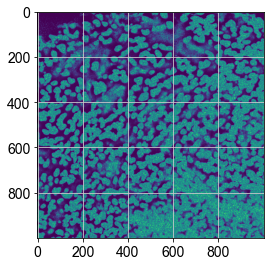

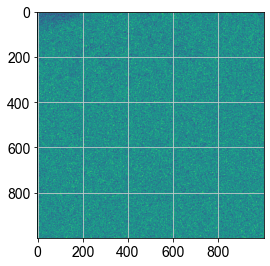

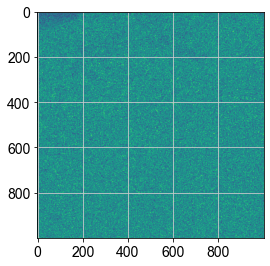

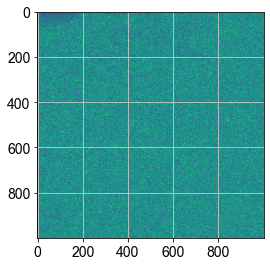

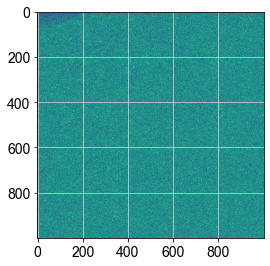

...

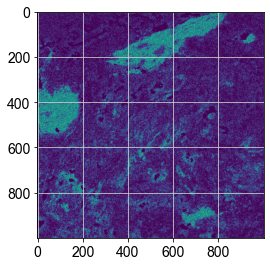

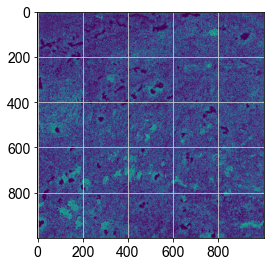

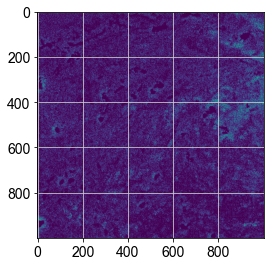

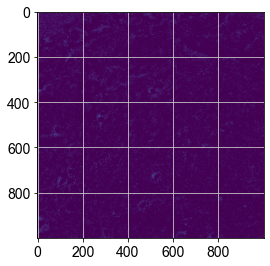

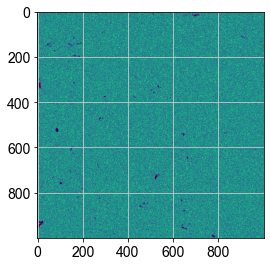

In [4]:
for i in range(92):
    plt.imshow(img[:,:,i])
    plt.show()

In [5]:
def plot(slidedata, tile, channel1, channel2):
    image = np.expand_dims(slidedata.tiles[tile].image, axis=0)
    nuc_segmentation_predictions = np.expand_dims(slidedata.tiles[tile].masks['nuclear_segmentation'], axis=0)
    cell_segmentation_predictions = np.expand_dims(slidedata.tiles[tile].masks['cell_segmentation'], axis=0)
    #nuc_cytoplasm = np.expand_dims(np.concatenate((image[:,:,:,channel1,0], image[:,:,:,channel2,0]), axis=2), axis=0)
    nuc_cytoplasm = np.stack((image[:,:,:,channel1], image[:,:,:,channel2]), axis=-1)
    rgb_images = create_rgb_image(nuc_cytoplasm, channel_colors=['blue', 'green'])
    overlay_nuc = make_outline_overlay(rgb_data=rgb_images, predictions=nuc_segmentation_predictions)
    overlay_cell = make_outline_overlay(rgb_data=rgb_images, predictions=cell_segmentation_predictions)
    fig, ax = plt.subplots(1, 2, figsize=(15, 15))
    ax[0].imshow(rgb_images[0, ...])
    ax[1].imshow(overlay_cell[0, ...])
    ax[0].set_title('Raw data')
    ax[1].set_title('Cell Predictions')
    plt.show()

Let's check the quality of our segmentations in a 1000x1000 pixel tile.

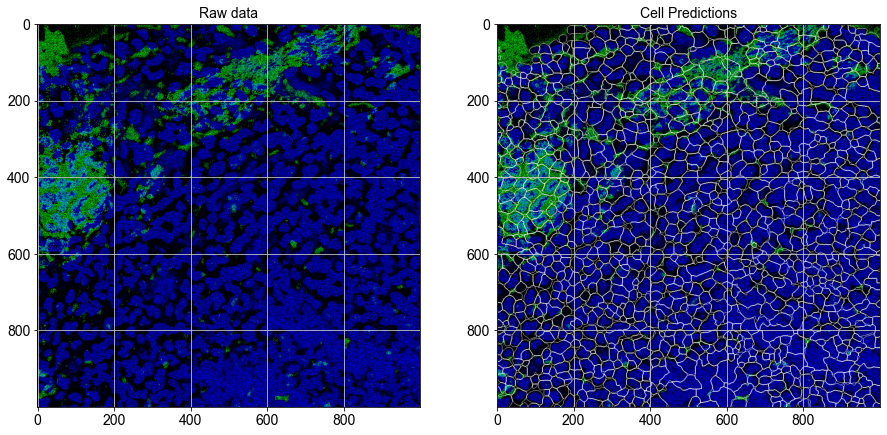

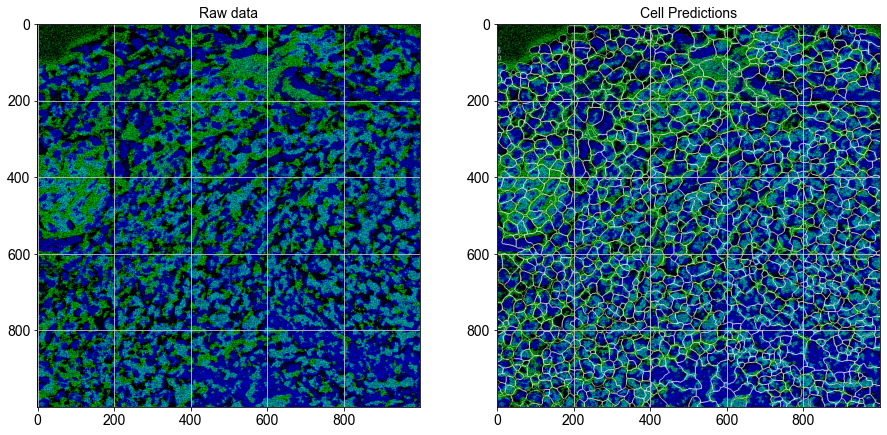

In [6]:
# DAPI + Syp
plot(slidedata, tile=0, channel1=0, channel2=60)

# DAPI + CD44
plot(slidedata, tile=0, channel1=0, channel2=24)

Now let's explore the single-cell quantification of our imaging data.

In [7]:
adata = slidedata.tiles[0].counts.copy()

In [8]:
adata

AnnData object with n_obs × n_vars = 1108 × 92
    obs: 'x', 'y', 'coords', 'filled_area', 'slice', 'euler_number'
    obsm: 'spatial'
    layers: 'min_intensity', 'max_intensity'

In [9]:
adata.X

array([[ 80.67839   , 118.67839   , 127.30653   , ...,   9.020101  ,
          2.1256282 , 101.43719   ],
       [ 70.44262   , 111.516396  , 133.39345   , ...,  12.844262  ,
          6.655738  ,  90.540985  ],
       [ 31.75      , 113.86957   , 129.13586   , ...,   6.4076085 ,
          2.7065217 ,  96.146736  ],
       ...,
       [ 64.69748   , 128.15546   , 129.91176   , ...,  12.613445  ,
          0.8907563 , 126.117645  ],
       [ 85.53571   , 127.82738   , 127.85119   , ...,  13.047619  ,
          0.64285713, 113.75595   ],
       [ 34.463158  , 133.3158    , 129.91579   , ...,  19.347368  ,
          5.2526317 , 131.6421    ]], dtype=float32)

In [10]:
adata.obs

,x,y,coords,filled_area,slice,euler_number
0,3.703518,632.577889,"[[0, 620], [0, 621], [0, 622], [0, 623], [0, 6...",199,"(slice(0, 10, None), slice(620, 645, None))",1
1,3.639344,697.180328,"[[0, 690], [0, 691], [0, 692], [0, 693], [0, 6...",122,"(slice(0, 10, None), slice(690, 706, None))",1
2,4.152174,748.086957,"[[0, 737], [0, 738], [0, 739], [0, 740], [0, 7...",184,"(slice(0, 12, None), slice(737, 759, None))",1
3,3.064516,306.064516,"[[0, 303], [0, 304], [0, 305], [0, 306], [0, 3...",62,"(slice(0, 7, None), slice(301, 312, None))",1
4,4.578397,387.501742,"[[0, 375], [0, 376], [0, 377], [0, 378], [0, 3...",287,"(slice(0, 12, None), slice(372, 404, None))",1
...,...,...,...,...,...,...
1103,994.333333,990.881356,"[[987, 989], [987, 990], [988, 988], [988, 989...",177,"(slice(987, 1000, None), slice(982, 1000, None))",1
1104,994.942857,70.457143,"[[988, 71], [988, 72], [989, 69], [989, 70], [...",175,"(slice(988, 1000, None), slice(60, 81, None))",1
1105,995.193277,95.516807,"[[990, 90], [990, 91], [990, 92], [990, 93], [...",238,"(slice(990, 1000, None), slice(81, 111, None))",1
1106,995.267857,950.601190,"[[990, 955], [990, 956], [990, 957], [991, 945...",168,"(slice(990, 1000, None), slice(940, 961, None))",1


In [11]:
adata.var

""
0
1
2
3
4
...
87
88
89
90


This anndata object gives us access to the entire python (or Seurat) single cell analysis ecosystem of tools.

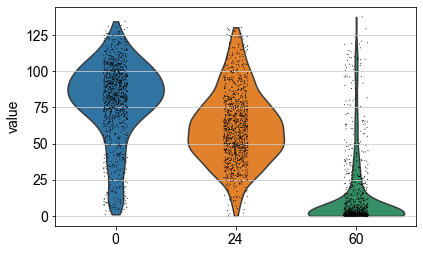

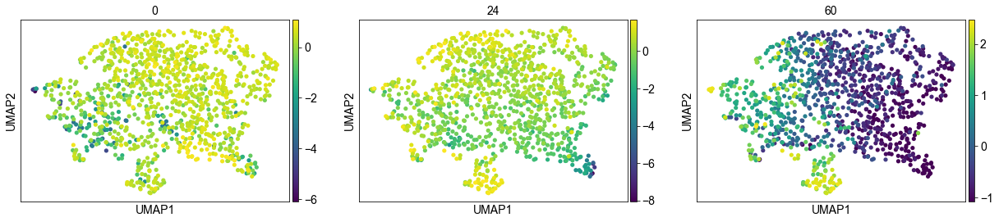

In [12]:
import scanpy as sc
sc.pl.violin(adata, keys = ['0','24','60'])
sc.pp.log1p(adata)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['0','24','60'])

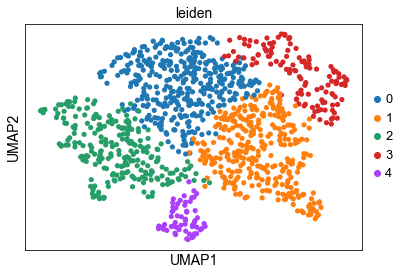

/home/ryc4001/anaconda3/envs/pathml/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


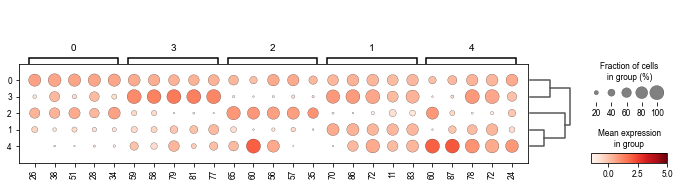

In [13]:
sc.tl.leiden(adata, resolution = 0.15)
sc.pl.umap(adata, color='leiden')
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups_dotplot(adata, groupby='leiden', vmax=5, n_genes=5)

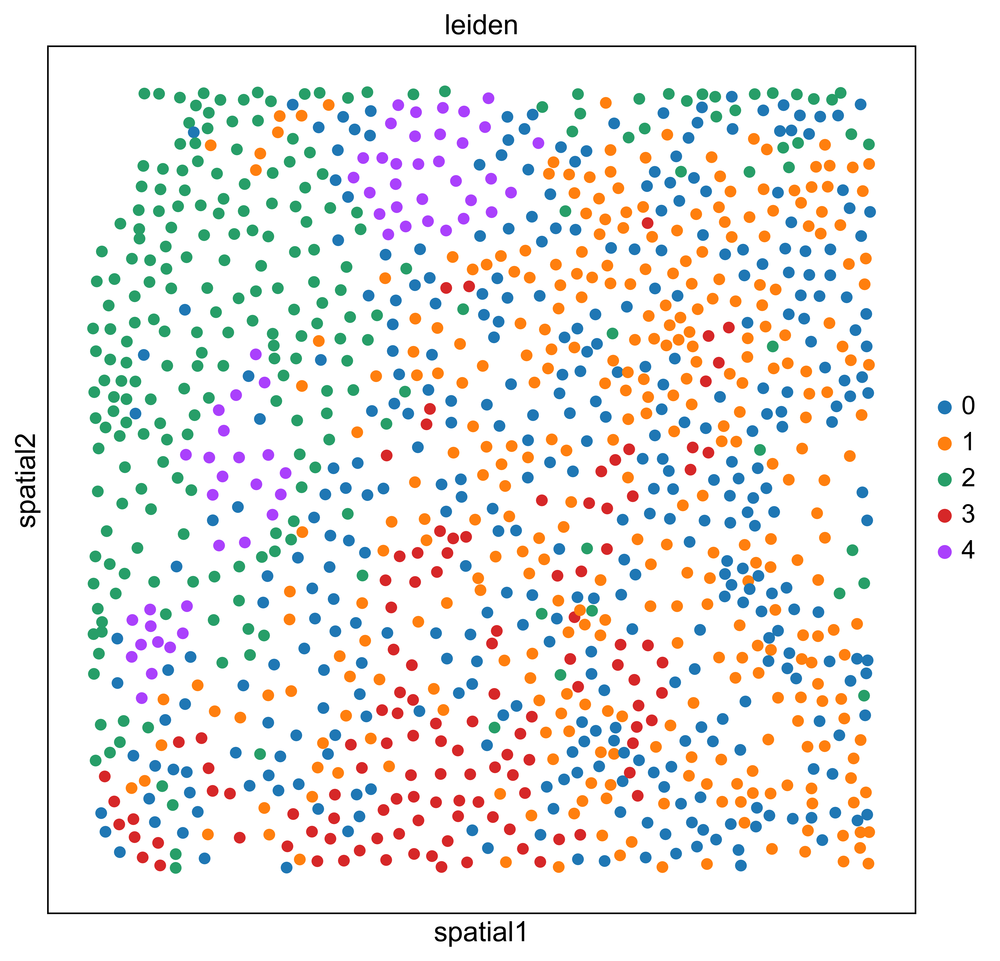

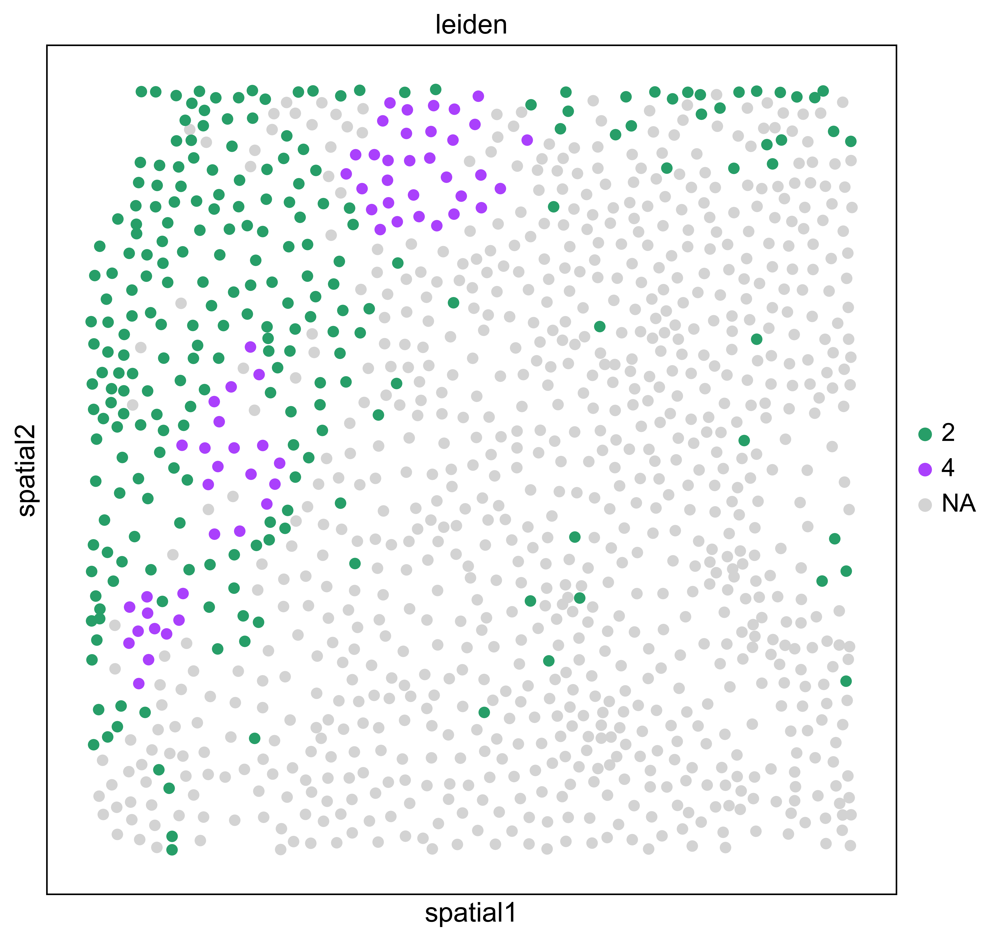

In [14]:
import scanpy as sc
import squidpy as sq
sc.set_figure_params(dpi=800, frameon=True, figsize=(8,8), format='png')
sc.pl.spatial(adata, color='leiden', spot_size=15)
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "2",
        "4"
    ],
    spot_size=15
)

  0%|          | 0/1000 [00:00<?, ?/s]

/home/ryc4001/anaconda3/envs/pathml/lib/python3.8/site-packages/squidpy/pl/_utils.py:536: MatplotlibDeprecationWarning: In a future version, 'pad' will default to rcParams['figure.subplot.hspace'].  Set pad=0 to keep the old behavior.
  col_ax = divider.append_axes("top", size="5%")


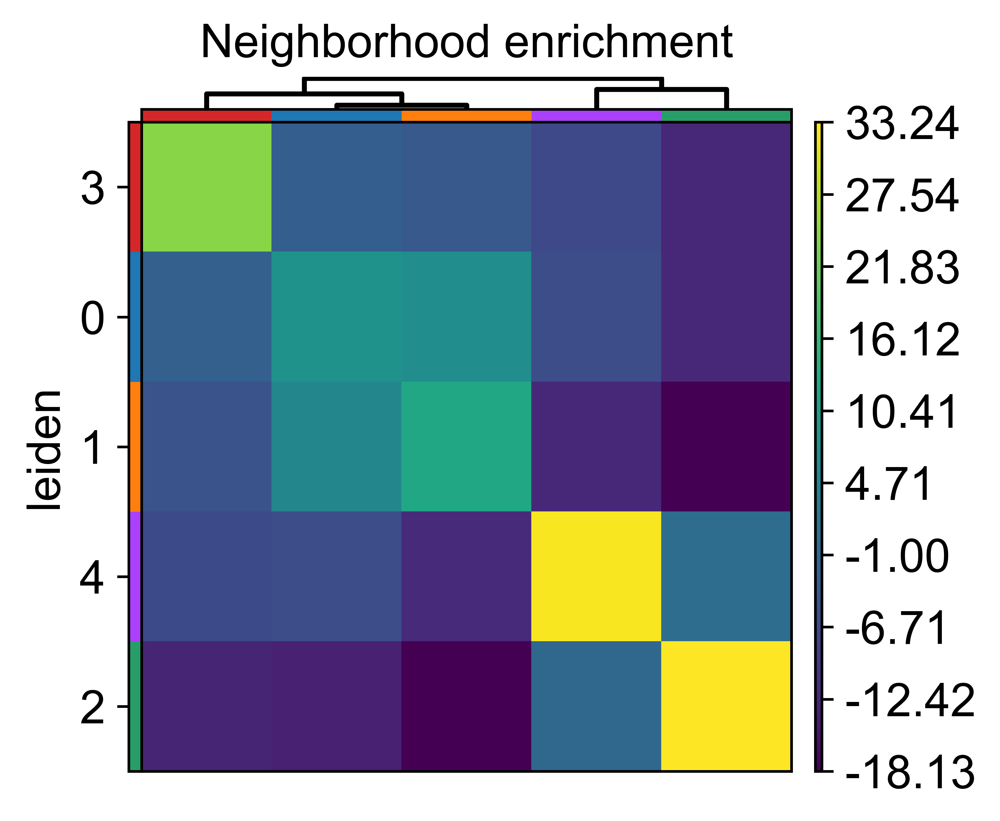

In [15]:
sq.gr.spatial_neighbors(adata)
sq.gr.nhood_enrichment(adata, cluster_key="leiden")
sq.pl.nhood_enrichment(adata, cluster_key="leiden", method="ward")

In [16]:
sq.gr.co_occurrence(adata, cluster_key="leiden")
sq.pl.co_occurrence(
    adata,
    cluster_key="leiden"
)

  0%|          | 0/1 [00:00<?, ?/s]